In [1]:
%load_ext autoreload
%autoreload 2
from antarctic_plots import fetch, regions, utils, maps
import pygmt
import pooch
import pandas as pd
import geopandas as gpd
import xarray as xr
import numpy as np
from pyproj import Transformer
from scipy.spatial import cKDTree
import rioxarray

c:\Users\matthewt\AppData\Local\miniforge3\envs\grav_inv_ant_plots\lib\site-packages\xarray\backends\cfgrib_.py:29: UserWarning: Failed to load cfgrib - most likely there is a problem accessing the ecCodes library. Try `import cfgrib` to get the full error message
  warnings.warn(


# Uncertainties

## Bedmap2

returning original grid


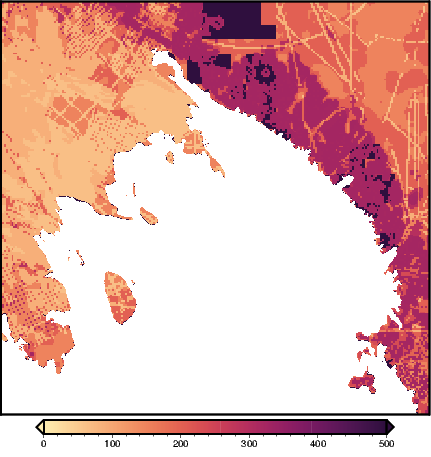

In [3]:
# fetch ice mask
icemask = fetch.bedmap2(layer="icemask_grounded_and_shelves")
# set all 1's to NaN's
tmp = pygmt.grdclip(icemask, new=(1,np.nan))
# set all 0's tp 1's
landmask = pygmt.grdclip(tmp, new=(0,1))

# fetch bedmap2 grounded bed uncertainty
bedmap2_bed_uncert = fetch.bedmap2(layer='grounded_bed_uncertainty')
# mask out the non-grounded portions
bedmap2_bed_uncert = bedmap2_bed_uncert * landmask
# plot
maps.plot_grd(bedmap2_bed_uncert, cpt_lims=[0,500], cmap='matter', region=regions.ross_ice_shelf)

c:\Users\matthewt\AppData\Local\miniforge3\envs\grav_inv_ant_plots\lib\site-packages\xarray\backends\plugins.py:64: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)


returning original grid


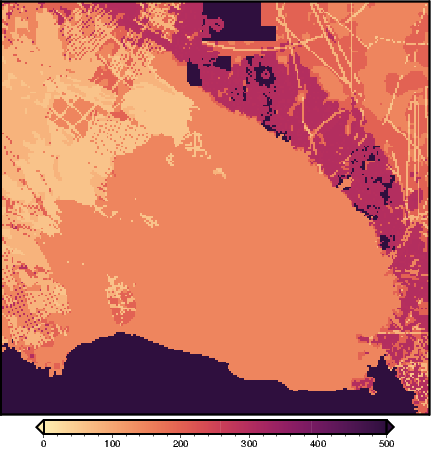

In [3]:
# fetch bedmap2 ice thickness uncertainty
bedmap2_ice_thickness_uncert = fetch.bedmap2(layer='thickness_uncertainty_5km')
maps.plot_grd(bedmap2_ice_thickness_uncert, cpt_lims=[0,500], cmap='matter', region=regions.ross_ice_shelf)

## Bedmachine

returning original grid


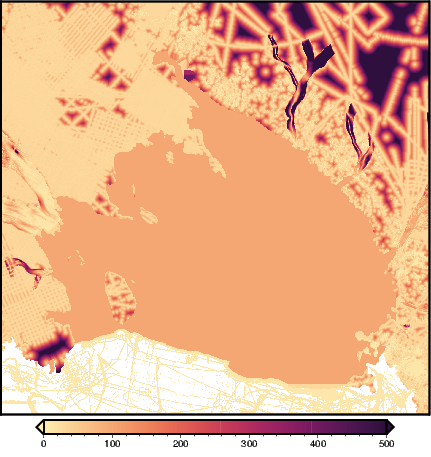

In [6]:
# fetch bedmachine bed uncertainty
bedmachine_bed_uncert = fetch.bedmachine(layer="errbed")

# plot
maps.plot_grd(bedmachine_bed_uncert, cpt_lims=[0,500], cmap='matter', region=regions.ross_ice_shelf)

returning original grid


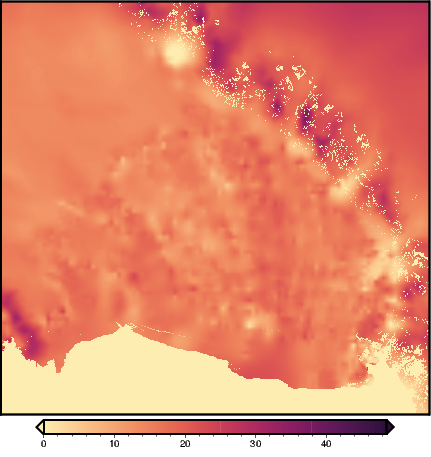

In [7]:
# bedmachine surface elevation and ice thickness are in ice equivalent (they include a firn air content correction)
# elevation of the top of the snow is from REMA (Howat et al. 2019)
# can  be calculated by adding firndepth to the surface 

# for inversion, we could have a firn layer (surface+firn -> surface) and an ice layer (surface -> surface-ice_thickness)
# fetch bedmachine firn thickness
bedmachine_firn = fetch.bedmachine(layer="firn")

# plot
maps.plot_grd(bedmachine_firn, cmap='matter', region=regions.ross_ice_shelf)

# Plotting Function

In [2]:
# make function for a starting point for RIS plots
# default map extent is for Ross Ice Shelf
def start_fig(n = -1600e3, e = -860e3, s = -200e3, w = 670e3, 
    subplots=False):
    global fig, fig_reg, fig_proj, fig_proj_ll, barwidth, pos_str
    
    #set figure height, width and map scale
    fig_height = 180 # in mm
    fig_width = fig_height*(w-e)/(s-n)
    fig_ratio = (s-n)/(fig_height/1000)

    # Make a GMT region string and projection strings in both ESPG3031 and Lat/Lon
    fig_reg = f'{e}/{w}/{n}/{s}'
    fig_proj = f"x1:{fig_ratio}"
    fig_proj_ll = f"s0/-90/-71/1:{fig_ratio}"

    # colorbar width and position
    barwidth = fig_width/10 * 0.8 # color bar width is 40% of the map width, in cm
    pos_str = f'jBC+w{barwidth}c/.5c+jTC+o0c/.2c+h+e'
    
    # initialize figure
    if subplots==False:
        fig = pygmt.Figure()
    # if adding a suplot, don't re-initialize, but move origin over    
    else:
        fig.shift_origin(xshift=fig_width/10)
    
    # add white background and frame
    fig.coast(region = fig_reg, projection = fig_proj_ll, land = 'white', water = 'white', 
              frame = ["nwse", "xf100000", "yf100000", "g0"],verbose='e')
    
    # plot groundingline and coastlines
    # fig.plot(projection=fig_proj, region=fig_reg,
    #         data=gpd.read_file('C:/Users\matthewt\Documents\Python_Scripts\RIS_gravity_inversion\plotting\GroundingLine_Antarctica_v02.shp'), 
    #         pen = '1.2p,black', verbose='e')
    # fig.plot(data=gpd.read_file('C:/Users\matthewt\Documents\Python_Scripts\RIS_gravity_inversion\plotting\Coastline_Antarctica_v02.shp'), 
    #         pen='1.2p,black', verbose='e')

    # plot graticules overtop, at 4d latitude and 30d longitude
    with pygmt.config(MAP_ANNOT_OFFSET_PRIMARY = '-2p', MAP_FRAME_TYPE = 'inside',
                  MAP_ANNOT_OBLIQUE = 0, FONT_ANNOT_PRIMARY = '8p,black', 
                  MAP_GRID_PEN_PRIMARY = 'grey', MAP_TICK_LENGTH_PRIMARY = '-10p',
                  MAP_TICK_PEN_PRIMARY = 'thinnest,grey', FORMAT_GEO_MAP = 'dddF',
                  MAP_POLAR_CAP = '90/90', ):
        fig.basemap(projection = fig_proj_ll, frame = ["NSWE", "xa30g15", "ya4g2"], verbose='e')
start_fig()

# Bedmap1 point data

In [3]:
# get ROSETTA-Ice gravity data
# switch this to pooch!
file = "bathymetry_data/bedmap_all.txt"
bedmap_df=pd.read_csv(
    file, 
    header=0, 
    index_col=False, 
    sep=',', 
    names=('MissionID','Latitude','Longitude','IceThickness','SurfaceElevation','WaterColumnThickness','BedElevation'), 
    na_values=[" ", " #####"]   #set the Nan Values
) 
# 1276277 rows
bedmap_df = bedmap_df[bedmap_df.BedElevation.notna()]    #remove NaNs
# 967915 rows
bedmap_df = bedmap_df[bedmap_df.BedElevation != -9999]     #remove BedElevation=-9999
# 209636 rows
bedmap_df = bedmap_df[bedmap_df.BedElevation != 9999]      #remove BedElevation=9999
# 209631 rows
# bedmap_df = bedmap_df.drop(index=[189277,347242])   # remove two rows, based on labels, with bedelevation errors
bedmap_df =bedmap_df[(bedmap_df.MissionID != 41) & (bedmap_df.MissionID != 42)] # remove points associated with mission 42, which erroneously has bed elevations
# 180126 rows

# if we want just RIS data:
bedmap_df =bedmap_df[bedmap_df.MissionID.isin([1,19,95,25,67])] # 19/95=RIGGS, 25/67=Roosevelt, 1=IGY

transformer = Transformer.from_crs("epsg:4326", "epsg:3031")
bedmap_df['x'], bedmap_df['y'] = transformer.transform(bedmap_df.Latitude.tolist(), bedmap_df.Longitude.tolist())

cols_to_move = ['x', 'y']
bedmap_df = bedmap_df[ cols_to_move + [ col for col in bedmap_df.columns if col not in cols_to_move ]]

!gmt grdmask plotting/MEaSUREs_RIS.shp -Gplotting/RIS_GL_mask_outer.nc -I1000 -R-1560000/1400000/-2400000/560000 -NNaN/1/1
bedmap_RIS_df = pygmt.select(data=bedmap_df, gridmask='plotting/RIS_GL_mask_outer.nc')

bedmap_RIS_df.to_csv('bathymetry_data/bedmap_bed_RIS.csv', index=False)
bedmap_RIS_df

,x,y,MissionID,Latitude,Longitude,IceThickness,SurfaceElevation,WaterColumnThickness,BedElevation
0,-316007.544874,-1.165778e+06,1,-78.91666,-164.8333,369,48,104,-425
1,-232601.272638,-1.158792e+06,1,-79.15334,-168.6500,384,59,244,-539
2,-174949.002700,-1.172950e+06,1,-79.11667,-171.5167,328,49,416,-695
3,-125704.556827,-1.192655e+06,1,-78.99500,-173.9833,344,51,243,-536
4,14195.093007,-1.190224e+06,1,-79.07667,179.3167,369,51,510,-828
...,...,...,...,...,...,...,...,...,...
217,163967.046095,-1.251597e+06,19,-78.42028,172.5364,353,-9999,551,-841
218,281534.485687,-1.244032e+06,19,-78.30000,167.2483,218,-9999,365,-546
219,-388061.749338,-1.124889e+06,25,-79.08000,-160.9667,441,62,-9999,-463
220,-399382.614316,-1.128867e+06,25,-79.01167,-160.5167,502,70,-9999,-807


In [14]:
bedmap_df.MissionID.unique()

array([ 1, 19, 25])

In [5]:
# RIS extent
# n, e, s, w = -1600e3, -860e3, -200e3, 670e3
# bedmap[bedmap.x.between(e, w) & bedmap.y.between(n, s)].MissionID.unique()
# bedmap[bedmap.x.between(-560000, 400000) & bedmap.y.between(-1400000, -440000)].MissionID.unique()
#DiscoDeep extent
# bedmap_df[bedmap_df.x.between(262e3, 416e3) & bedmap_df.y.between(-1167e3, -1124e3)].MissionID.unique()
# remove MissionID == 42

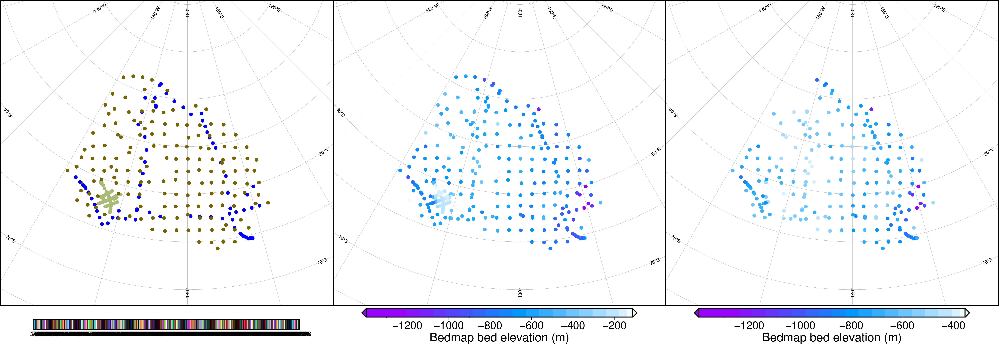

In [6]:
start_fig()

pygmt.makecpt(cmap='categorical', categorical=True)

fig.plot(x=bedmap_df.x, 
         y=bedmap_df.y, 
         color=bedmap_df.MissionID,
         style='c6p',
         projection = fig_proj,
         region=fig_reg, 
         cmap=True)

fig.colorbar()

start_fig(subplots=True)

pygmt.makecpt(cmap="globe", series=[bedmap_df.BedElevation.min(), bedmap_df.BedElevation.max()], background=True)

fig.plot(x=bedmap_df.x, 
         y=bedmap_df.y, 
         color=bedmap_df.BedElevation,
         style='c6p',
         projection = fig_proj,
         region=fig_reg, 
         cmap=True)

with pygmt.config(FONT_ANNOT_PRIMARY = '18p,black', FONT_LABEL = '20p,black'):
    fig.colorbar(cmap=True, position = pos_str, 
                 frame=['xa200f100+l"Bedmap bed elevation (m)"'], verbose='e')  

start_fig(subplots=True)

pygmt.makecpt(cmap="globe", series=[bedmap_RIS_df.BedElevation.min(), bedmap_RIS_df.BedElevation.max()], background=True)

fig.plot(x=bedmap_RIS_df.x, 
         y=bedmap_RIS_df.y, 
         color=bedmap_RIS_df.BedElevation,
         style='c6p',
         projection = fig_proj,
         region=fig_reg, 
         cmap=True)

with pygmt.config(FONT_ANNOT_PRIMARY = '18p,black', FONT_LABEL = '20p,black'):
    fig.colorbar(cmap=True, position = pos_str, 
                 frame=['xa200f100+l"Bedmap bed elevation (m)"'], verbose='e')  

fig.show()

In [7]:
fname="inversion_layers/bedmachine/BedMachine_bed.nc"
bedmachine = xr.load_dataset(fname) 

print(pygmt.grdinfo(bedmachine.z))

: Title: 
: Command: 
: Remark: 
: Gridline node registration used [Cartesian grid]
: Grid file format: nf = GMT netCDF format (32-bit float), CF-1.7
: x_min: -1560000 x_max: 1400000 x_inc: 1000 name: x n_columns: 2961
: y_min: -2400000 y_max: 560000 y_inc: 1000 name: y n_rows: 2961
: v_min: -5421.70898438 v_max: 4776.82324219 name: z
: scale_factor: 1 add_offset: 0
: format: classic
: Default CPT: 



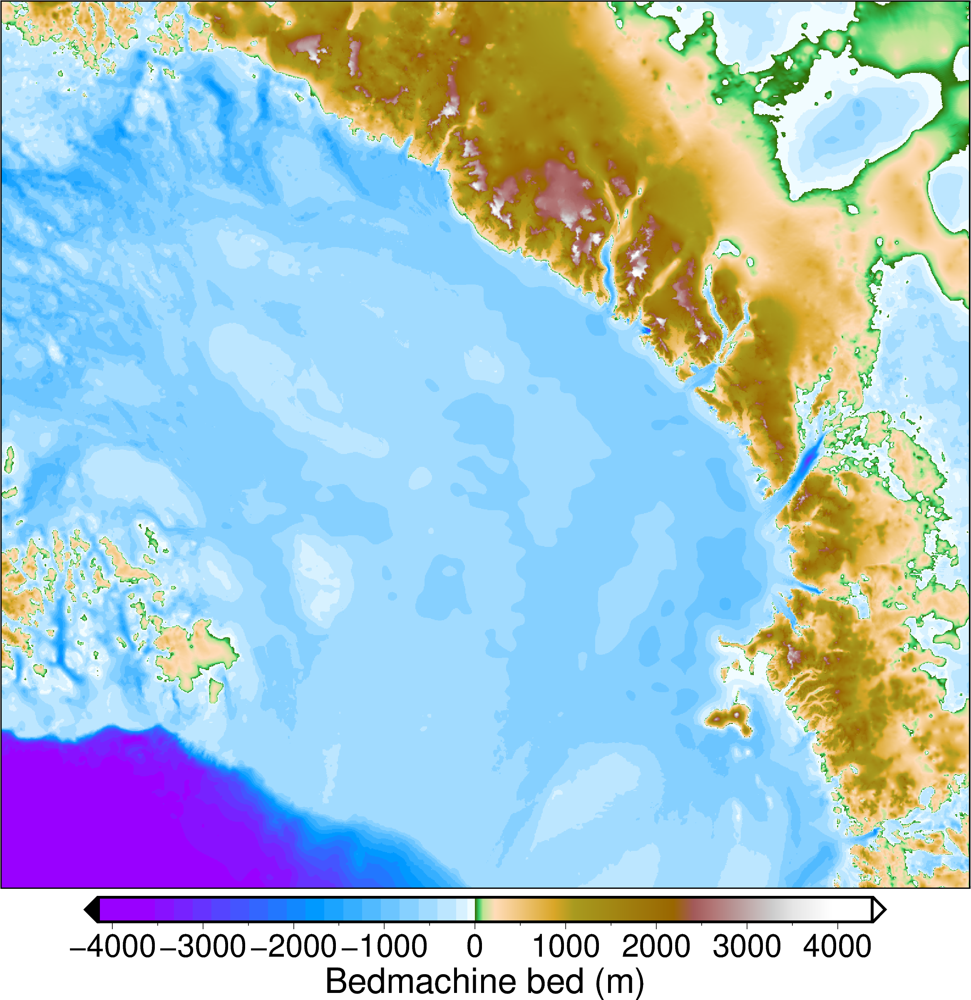

In [9]:
start_fig()

# plot grid
fig.grdimage(projection = fig_proj,
             grid=bedmachine.z,
             cmap='globe', nan_transparent=True)

# colorbar
with pygmt.config(FONT_ANNOT_PRIMARY = '18p,black', FONT_LABEL = '20p,black'):
    fig.colorbar(cmap=True, position = pos_str, 
                 frame=['xa1000f500+l"Bedmachine bed (m)"'], verbose='e')     

fig.show() 



In [27]:
# !gmt grdmath /Volumes/arc_04/tankerma/Datasets/bedmap2/bedmap2_tiff/bedmap2_bed.tif /Volumes/arc_04/tankerma/Datasets/bedmap2/bedmap2_tiff/gl04c_geiod_to_WGS84.tif ADD = /Volumes/arc_04/tankerma/Datasets/bedmap2/bedmap2_tiff/bedmap2_bed_WGS_84.nc
!gmt grdsample /Volumes/arc_04/tankerma/Datasets/bedmap2/bedmap2_tiff/bedmap2_bed.tif -R-1560000/1400000/-2400000/560000 -I500 -Gbathymetry_data/bedmap2_bed_regional.nc
!gmt grdfilter bathymetry_data/bedmap2_bed_regional.nc -R-1560000/1400000/-2400000/560000 -Gbathymetry_data/bedmap2_bed.nc -D0 -I1000 -Fg1000 -rg

fname='bathymetry_data/bedmap2_bed.nc'
bedmap = xr.load_dataset(fname)
print(pygmt.grdinfo(bedmap.z))

: Title: 
: Command: 
: Remark: 
: Gridline node registration used [Cartesian grid]
: Grid file format: nf = GMT netCDF format (32-bit float), CF-1.7
: x_min: -1560000 x_max: 1400000 x_inc: 1000 name: x n_columns: 2961
: y_min: -2400000 y_max: 560000 y_inc: 1000 name: y n_rows: 2961
: v_min: -5296.27539062 v_max: 3970.12304688 name: z
: scale_factor: 1 add_offset: 0
: format: classic
: Default CPT: 



In [29]:
!gmt grdinfo bathymetry_data/bedmap2_bed_regional.nc

bathymetry_data/bedmap2_bed_regional.nc: Title: 
bathymetry_data/bedmap2_bed_regional.nc: Command: gmt grdsample /Volumes/arc_04/tankerma/Datasets/bedmap2/bedmap2_tiff/bedmap2_bed.tif -R-1560000/1400000/-2400000/560000 -I500 -Gbathymetry_data/bedmap2_bed_regional.nc
bathymetry_data/bedmap2_bed_regional.nc: Remark: 
bathymetry_data/bedmap2_bed_regional.nc: Pixel node registration used [Cartesian grid]
bathymetry_data/bedmap2_bed_regional.nc: Grid file format: nf = GMT netCDF format (32-bit float), CF-1.7
bathymetry_data/bedmap2_bed_regional.nc: x_min: -1560000 x_max: 1400000 x_inc: 500 name: x n_columns: 5920
bathymetry_data/bedmap2_bed_regional.nc: y_min: -2400000 y_max: 560000 y_inc: 500 name: y n_rows: 5920
bathymetry_data/bedmap2_bed_regional.nc: v_min: -5299.26611328 v_max: 3989.22412109 name: z
bathymetry_data/bedmap2_bed_regional.nc: scale_factor: 1 add_offset: 0
bathymetry_data/bedmap2_bed_regional.nc: format: netCDF-4 chunk_size: 129,129 shuffle: on deflation_level: 3
bathymetr

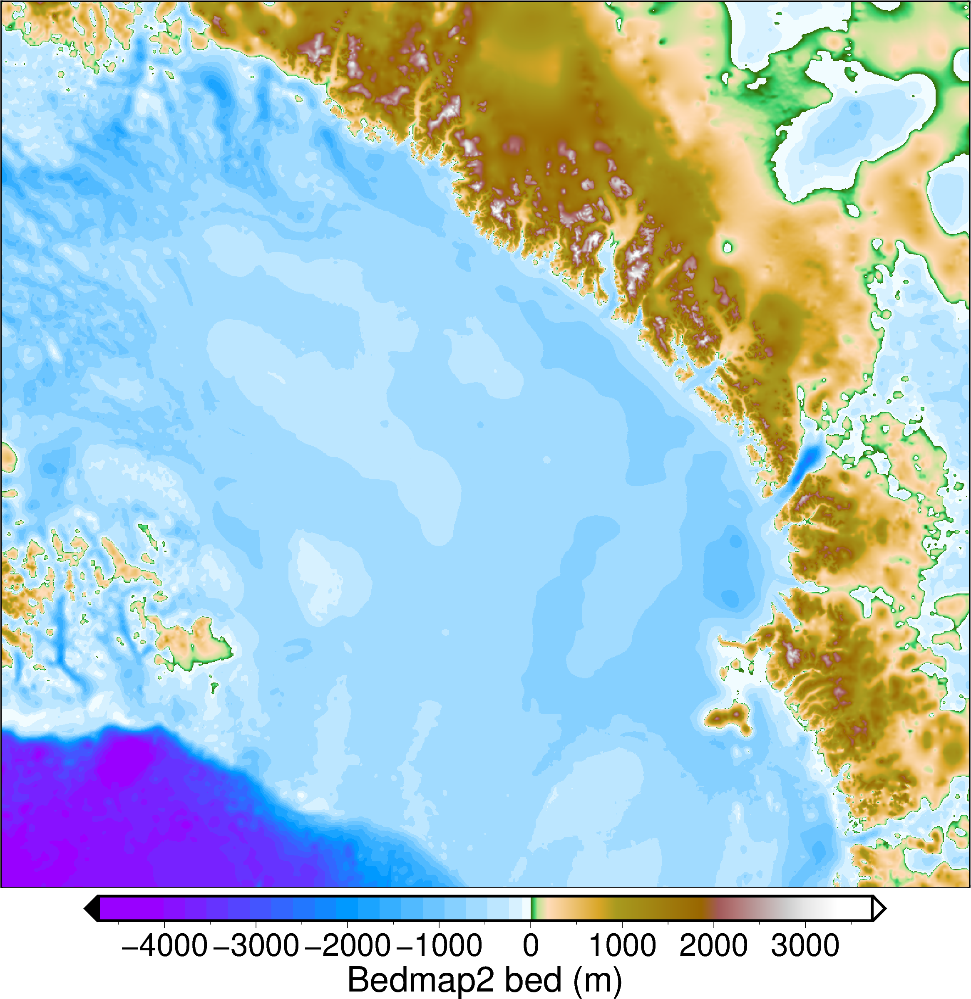

In [30]:
start_fig()

# plot grid
fig.grdimage(projection = fig_proj,
             grid='bathymetry_data/bedmap2_bed.nc',
             cmap='globe', nan_transparent=True)

# colorbar
with pygmt.config(FONT_ANNOT_PRIMARY = '18p,black', FONT_LABEL = '20p,black'):
    fig.colorbar(cmap=True, position = pos_str, 
                 frame=['xa1000f500+l"Bedmap2 bed (m)"'], verbose='e')     

fig.show() 

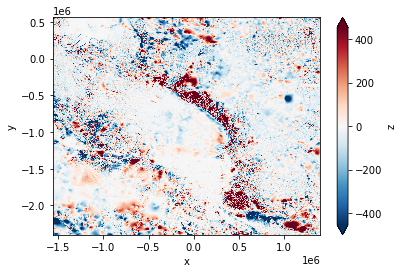

In [34]:
diff = bedmachine.z -bedmap.z
diff.plot(robust=True)
# start_fig()

# pygmt.makecpt(cmap='polar+h0', series=(-200,200), background=True)
# # plot grid
# fig.grdimage(projection = fig_proj,
#              grid=diff,
#              cmap=True, nan_transparent=True)

# # colorbar
# with pygmt.config(FONT_ANNOT_PRIMARY = '18p,black', FONT_LABEL = '20p,black'):
#     fig.colorbar(cmap=True, position = pos_str, 
#                  frame=['xa100f50+l"Bedmap2 bed (m)"'], verbose='e')     

# fig.show() 

In [6]:
# clip Bedmap2 outside of RIS
# !gmt grdmask plotting/MEaSUREs_RIS.shp -Gplotting/RIS_GL_mask_outer.nc -I1000 -R-1560000/1400000/-2400000/560000 -NNaN/1/1
# !gmt grdmath -Df bathymetry_data/bedmap2_bed.nc plotting/RIS_GL_mask_outer.nc MUL = bathymetry_data/bedmap_clip.nc
# clip Bedmachine inside of RIS
# !gmt grdmask plotting/MEaSUREs_RIS.shp -Gplotting/RIS_GL_mask_inner.nc -I1000 -R-1560000/1400000/-2400000/560000 -N1/NaN/NaN
# !gmt grdmath -Df inversion_layers/bedmachine/BedMachine_bed.nc plotting/RIS_GL_mask_inner.nc MUL = bathymetry_data/bedmachine_clip.nc

# merge bedmachine outside RIS with bedmap inside RIS
# !gmt grdblend bathymetry_data/bedmachine_clip.nc bathymetry_data/bedmap_clip.nc -R-1560000/1400000/-2400000/560000 -Gbathymetry_data/bedmap_bedmachine_merge.nc

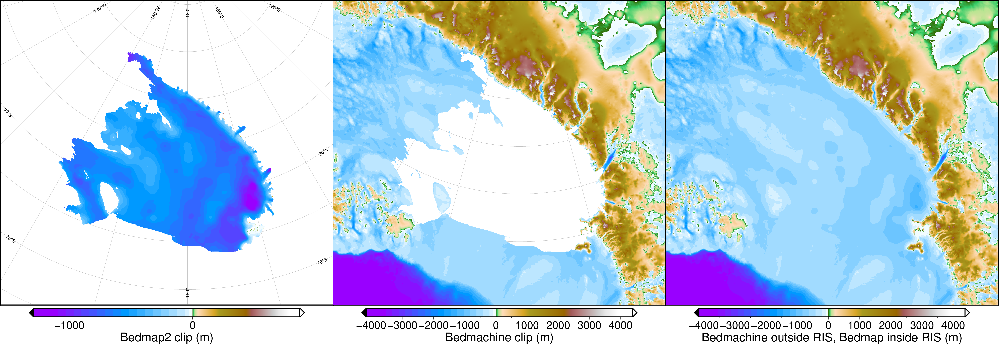

In [10]:
start_fig()

# plot grid
fig.grdimage(projection = fig_proj,
             grid='bathymetry_data/bedmap_clip.nc',
             cmap='globe', nan_transparent=True)

# colorbar
with pygmt.config(FONT_ANNOT_PRIMARY = '18p,black', FONT_LABEL = '20p,black'):
    fig.colorbar(cmap=True, position = pos_str, 
                 frame=['xa1000f500+l"Bedmap2 clip (m)"'], verbose='e')     

start_fig(subplots=True)

fig.grdimage(projection = fig_proj,
             grid='bathymetry_data/bedmachine_clip.nc',
             cmap='globe', nan_transparent=True)

# colorbar
with pygmt.config(FONT_ANNOT_PRIMARY = '18p,black', FONT_LABEL = '20p,black'):
    fig.colorbar(cmap=True, position = pos_str, 
                 frame=['xa1000f500+l"Bedmachine clip (m)"'], verbose='e')   

start_fig(subplots=True)

fig.grdimage(projection = fig_proj,
             grid="bathymetry_data/bedmap_bedmachine_merge.nc",
             cmap='globe', nan_transparent=True)

# colorbar
with pygmt.config(FONT_ANNOT_PRIMARY = '18p,black', FONT_LABEL = '20p,black'):
    fig.colorbar(cmap=True, position = pos_str, 
                 frame=['xa1000f500+l"Bedmachine outside RIS, Bedmap inside RIS (m)"'], verbose='e')  
               
fig.show() 

In [19]:
# mask bedmap/bedmachine merged grid at RIGGS points
# !gmt grdmask bathymetry_data/bedmap_bed_RIS.csv -S1c -N1/NaN/NaN -I1000 -R-1560000/1400000/-2400000/560000 -Gplotting/RIGGS_mask.nc
# !gmt grdmath -Df bathymetry_data/bedmap_bedmachine_merge.nc plotting/RIGGS_mask.nc MUL = bathymetry_data/bedmap_bedmachine_RIGGS_clip.nc
# RIGGS_holes = pygmt.grd2xyz("bathymetry_data/bedmap_bedmachine_RIGGS_clip.nc")
# RIGGS_holes.dropna(inplace=True)

# merge bedmap/bedmachine data with RIGGS points
# bedmap_RIS_df_merge = bedmap_RIS_df[['x', 'y', 'BedElevation']].copy().rename(columns={'BedElevation':'z'})
# bedmap_RIS_df_merge.dropna(inplace=True)
# bedmap_bedmachine_RIGGS = RIGGS_holes.merge(bedmap_RIS_df_merge, how='outer')
# bedmap_bedmachine_RIGGS_grd = pygmt.xyz2grd(bedmap_bedmachine_RIGGS, region='-1560000/1400000/-2400000/560000', spacing=1000) 
# pygmt.grdfill(grid=bedmap_bedmachine_RIGGS_grd, outgrid = 'bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc', mode='n')

# merge RIGGS points with points outside RIS
# bedmachine_clip = pygmt.grd2xyz('bathymetry_data/bedmachine_clip.nc')
# bedmachine_clip.dropna(inplace=True)

bedmachine_RIGGS = bedmachine_clip.merge(bedmap_RIS_df_merge, how='outer')
bedmachine_RIGGS.to_csv('bathymetry_data/bedmachine_RIGGS.csv', index=False)
# bedmachine_RIGGS = pd.read_csv('bathymetry_data/bedmachine_RIGGS.csv', index_col=False,)
pygmt.xyz2grd(bedmachine_RIGGS, region='-1560000/1400000/-2400000/560000', outgrid='bathymetry_data/bathy_control_points.nc', spacing=1000) 

/home/tankerma/miniconda/envs/grav_inv2/lib/python3.10/site-packages/pandas/core/reshape/merge.py:1215: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(
/home/tankerma/miniconda/envs/grav_inv2/lib/python3.10/site-packages/pandas/core/reshape/merge.py:1205: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  warnings.warn(


In [20]:
!gmt grdinfo bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc

bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc: Title: 
bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc: Command: 
bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc: Remark: 
bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc: Gridline node registration used [Cartesian grid]
bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc: Grid file format: nf = GMT netCDF format (32-bit float), CF-1.7
bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc: x_min: -1560000 x_max: 1400000 x_inc: 1000 name: x n_columns: 2961
bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc: y_min: -2400000 y_max: 560000 y_inc: 1000 name: y n_rows: 2961
bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc: v_min: -5421.70898438 v_max: 4776.82324219 name: z
bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc: scale_factor: 1 add_offset: 0
bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc: format: netCDF-4 chunk_size: 129,129 shuffle: on deflation_level: 3
bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc

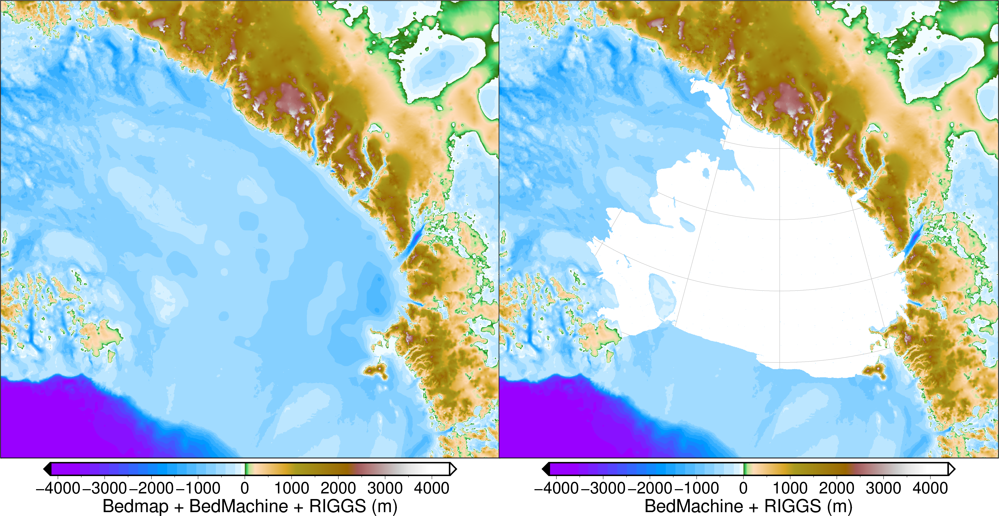

In [21]:
start_fig()

# plot grid
fig.grdimage(projection = fig_proj,
             grid='bathymetry_data/bedmap_bedmachine_RIGGS_grd_fill.nc',
             cmap='globe', nan_transparent=True)

# colorbar
with pygmt.config(FONT_ANNOT_PRIMARY = '18p,black', FONT_LABEL = '20p,black'):
    fig.colorbar(cmap=True, position = pos_str, 
                 frame=['xa1000f500+l"Bedmap + BedMachine + RIGGS (m)"'], verbose='e')     

start_fig(subplots=True)

fig.grdimage(projection = fig_proj,
             grid='bathymetry_data/bathy_control_points.nc',
             cmap='globe', nan_transparent=True)

# colorbar
with pygmt.config(FONT_ANNOT_PRIMARY = '18p,black', FONT_LABEL = '20p,black'):
    fig.colorbar(cmap=True, position = pos_str, 
                 frame=['xa1000f500+l"BedMachine + RIGGS (m)"'], verbose='e') 
               
fig.show() 

In [3]:
# outer = 30e3
# inner = 5e3

# # if distance from nearest constriant > outer, set to 1 (fully free to invert), else 0
# # if 0 (<outer from constraint), make NaN

# !gmt grdmath inversion_layers/constraints_distances.nc $outer GT = inversion_layers/constraints_greater.nc
# !gmt grdmath inversion_layers/constraints_greater.nc 0 NAN = inversion_layers/constraints_greater.nc
# xr.load_dataarray('inversion_layers/constraints_greater.nc')#.plot()

# # if distance from nearest constraint > inner, set to 1, else 0 (completely constrained)
# # if 1 (>inner from constraint), make NaN
# !gmt grdmath inversion_layers/constraints_distances.nc $inner GT = inversion_layers/constraints_less.nc
# !gmt grdmath inversion_layers/constraints_less.nc 1 NAN = inversion_layers/constraints_less.nc
# xr.load_dataarray('inversion_layers/constraints_less.nc').plot()

# # merge above 2 grids
# !gmt grdblend inversion_layers/constraints_greater.nc inversion_layers/constraints_less.nc -Ginversion_layers/constraints_merge.nc
# constraints_merge = xr.load_dataset('inversion_layers/constraints_merge.nc')
# # constraints_merge.z.plot()
# constraints_merge.z.isel(x=slice(600,900), y=slice(600,900)).plot()

# # if distance between inner and outer, linearly increase from 0 to 1
# # constraints_merge = rioxarray.open_rasterio('inversion_layers/constraints_merge.nc')
# constraints_merge = constraints_merge.z.rio.write_crs("epsg:3031")
# constraints_grid = constraints_merge.rio.interpolate_na(method='linear')
# constraints_grid.plot()

# pygmt.grdclip(constraints_grid, 
#     # region="-660000/500000/-1500000/-340000", 
#     above=[1,1], # clip values above 1 to 1
#     below=[0,0], # clip values below 0 to 0
#     outgrid='inversion_layers/constraints_grid.nc')

# grid = xr.load_dataset('inversion_layers/constraints_grid.nc')
# grid.z.isel(x=slice(600,900), y=slice(600,900)).plot()
# # grid.z.plot()

<xarray.DataArray 'z' (y: 1401, x: 1531)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
  * x        (x) float64 -8.6e+05 -8.59e+05 -8.58e+05 ... 6.69e+05 6.7e+05
  * y        (y) float64 -1.6e+06 -1.599e+06 -1.598e+06 ... -2.01e+05 -2e+05
Attributes:
    long_name:     z
    actual_range:  [1. 1.]